In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
print(cv2.__version__)

4.8.0


In [ ]:
# Download and unzip data
!wget https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
!unzip -q images.zip

--2023-09-26 07:35:32--  https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
Resolving moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)... 52.95.149.122, 3.5.244.176, 52.95.143.114, ...
Connecting to moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)|52.95.149.122|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29586716 (28M) [application/zip]
Saving to: ‘images.zip’

images.zip          100%[===================>]  28.22M  21.3MB/s    in 1.3s    

2023-09-26 07:35:34 (21.3 MB/s) - ‘images.zip’ saved [29586716/29586716]



# **Transformation**

```cv2.warpAffine(image, T, (width, height))```


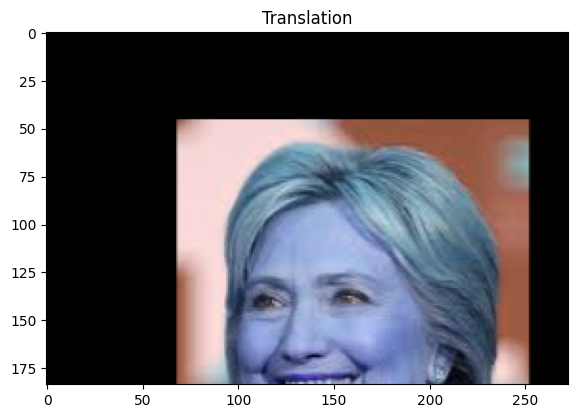

In [ ]:
width,height = cvtImg.shape[:2]
shift_width, shift_height = width/4,height/4

# Get the rotation matrix
matrix = np.float32([[1,0,shift_width],[0,1,shift_height]])
# Translate image
trans = cv2.warpAffine(cvtImg,matrix,(width,height))
display("Translation",trans)

In [ ]:
print(cvtImg.shape)
print(trans.shape)

(273, 184, 3)
(184, 273, 3)


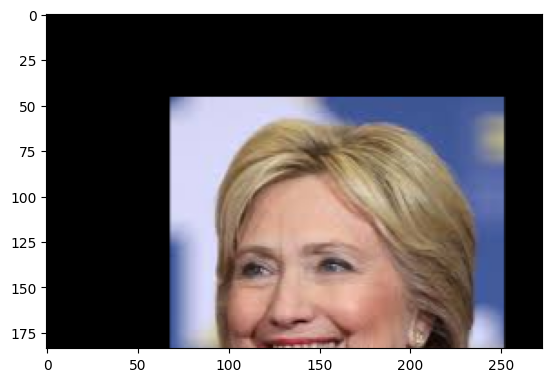

In [ ]:
plt.imshow(trans)

```cv2.getRotationMatrix2D(rotation_center_x, rotation_center_y, angle of rotation, scale)```


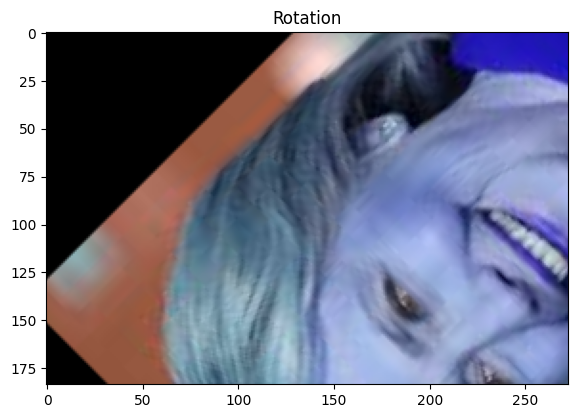

In [ ]:
# Get the rotation matrix
width,height = cvtImg.shape[:2]
x,y = width/2,height/2
Rot_matrix = cv2.getRotationMatrix2D((x,y),135,1.5)
# Rotate image
rot = cv2.warpAffine(cvtImg,Rot_matrix,(width,height))
display("Rotation",rot)

In [ ]:
print(Rot_matrix)

[[ -1.06066017   1.06066017 183.69937764]
 [ -1.06066017  -1.06066017 334.36084925]]


# Transpose

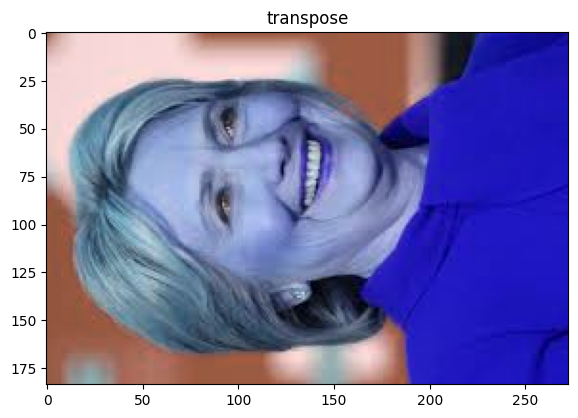

In [ ]:
rotated_img = cv2.transpose(cvtImg)
display("transpose",rotated_img)

# Flip

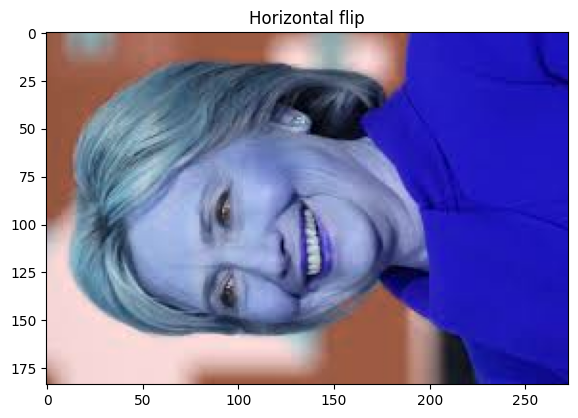

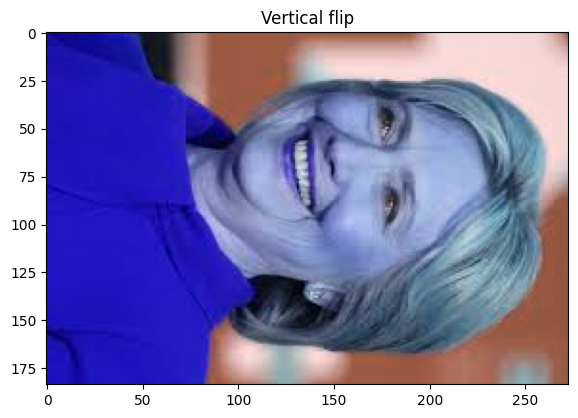

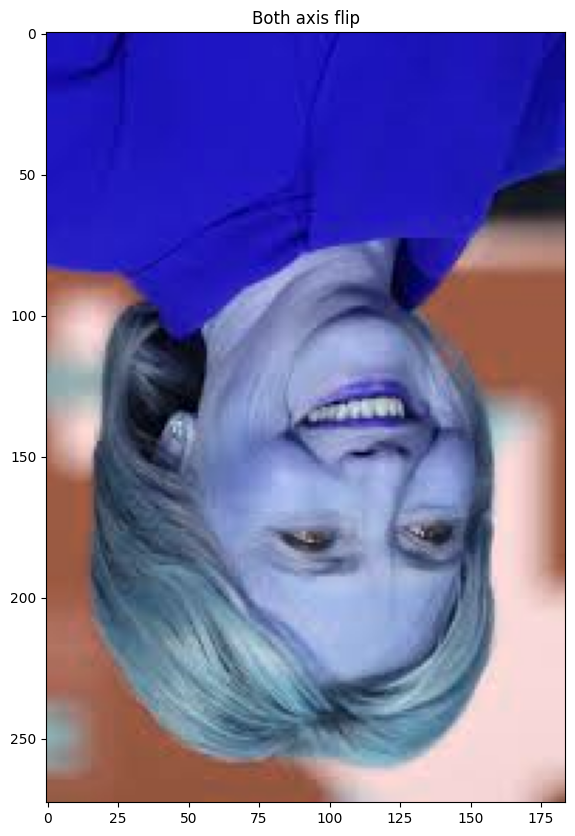

In [ ]:
x_flipped = cv2.flip(rotated_img,0)
y_flipped = cv2.flip(rotated_img,1)
both_flipped = cv2.flip(cvtImg,-1)
display("Horizontal flip",x_flipped)
display("Vertical flip",y_flipped)
display("Both axis flip",both_flipped)

# **6. Scaling, Re-sizing, Interpolations and Cropping**


***Resizing***

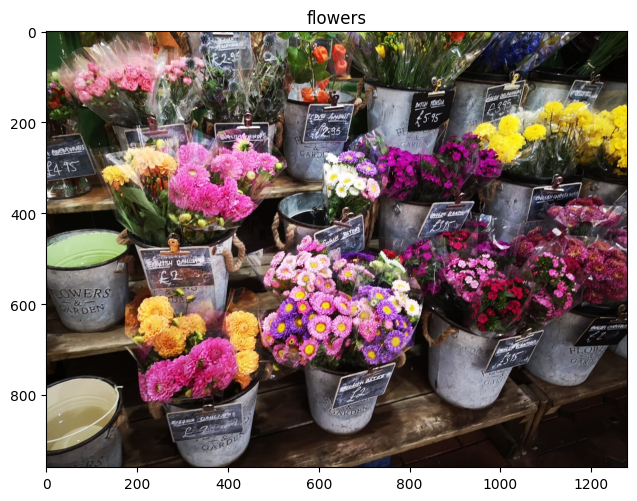

In [ ]:
flowers = cv2.imread("images/flowers.jpeg")
display("flowers",flowers)

Text(0.5, 1.0, 'INTER CUBIC')

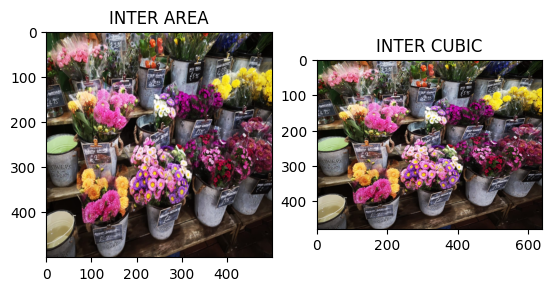

In [ ]:
scaled_img1 = cv2.resize(flowers,(500,500),interpolation=cv2.INTER_AREA)
scaled_img2 = cv2.resize(flowers,None,fx=0.5,fy=0.5,interpolation=cv2.INTER_CUBIC)

plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(scaled_img1,cv2.COLOR_BGR2RGB))
plt.title("INTER AREA")
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(scaled_img2,cv2.COLOR_BGR2RGB))
plt.title('INTER CUBIC')


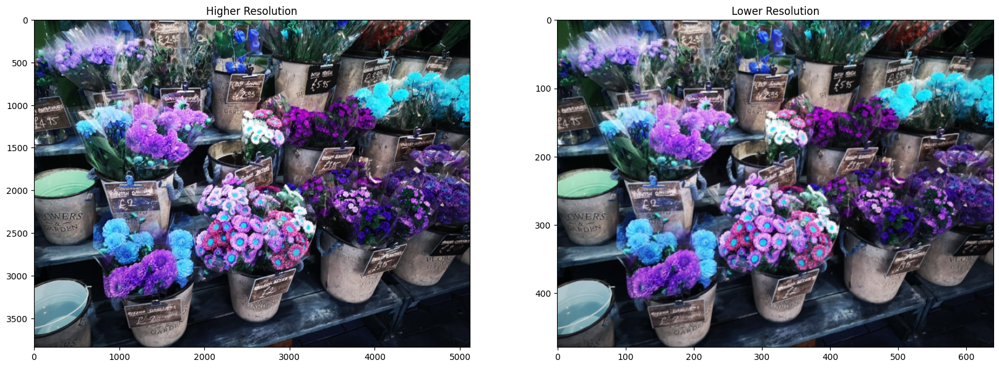

In [ ]:
higher_reso = cv2.pyrUp(cv2.pyrUp(flowers))
lower_reso = cv2.pyrDown(flowers)

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(higher_reso)
plt.title("Higher Resolution")
plt.subplot(1,2,2)
plt.imshow(lower_reso)
plt.title("Lower Resolution")
plt.show()

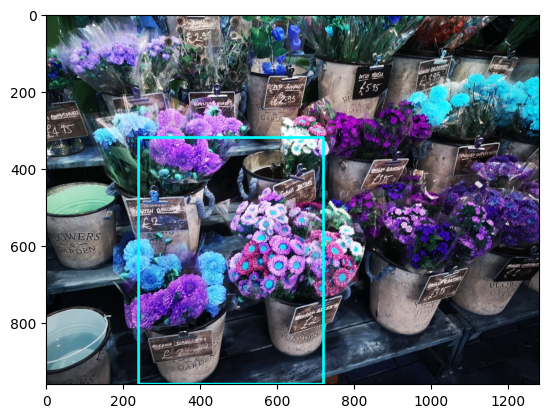

In [ ]:
height,width = flowers.shape[:2]
start_x,start_y = int(height*0.25),int(width*0.25)
end_x,end_y = int(height*0.75),int(width*0.75)
cropped_image =  flowers[start_x:end_x,start_y:end_y]
# Draw rectangle
copy = flowers.copy()
cv2.rectangle(copy,(start_x,start_y),(end_x,end_y),(0,255,255),5)

plt.imshow(cropped_image)
plt.imshow(copy)
plt.show()

# **7.Arithmetic and Bitwise operations**

[[100 100 100 ... 102 102 102]
 [100 100 100 ... 103 102 102]
 [100 100 100 ... 103 103 102]
 ...
 [ 23  20  19 ...  10   9   9]
 [ 26  22  19 ...  10  10   9]
 [ 32  26  21 ...  10  10   9]]


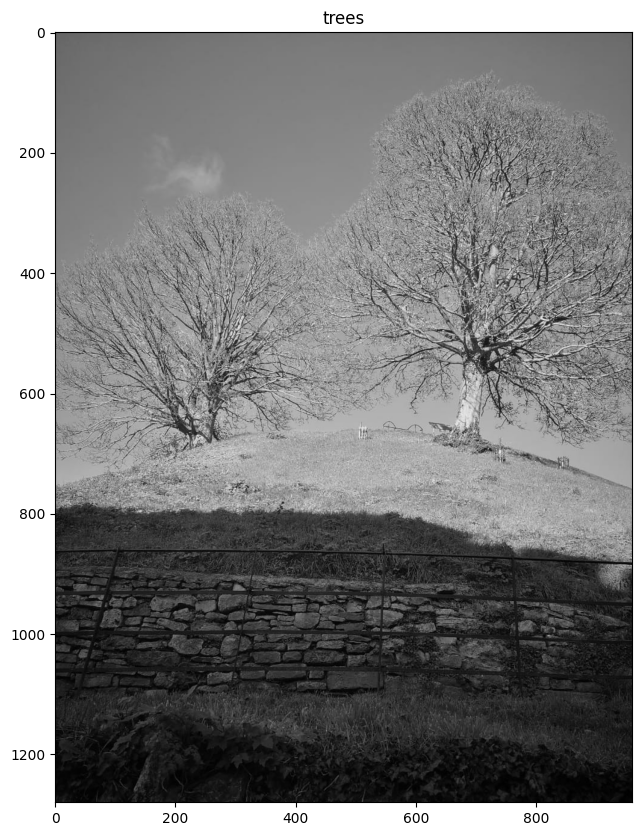

In [ ]:
trees = cv2.imread("images/trees.jpeg",0)
print(trees)
display("trees",trees)

In [ ]:
M = np.ones(trees.shape,dtype=np.uint8)*200
M

array([[200, 200, 200, ..., 200, 200, 200],
       [200, 200, 200, ..., 200, 200, 200],
       [200, 200, 200, ..., 200, 200, 200],
       ...,
       [200, 200, 200, ..., 200, 200, 200],
       [200, 200, 200, ..., 200, 200, 200],
       [200, 200, 200, ..., 200, 200, 200]], dtype=uint8)

*Increasing brightness*

Text(0.5, 1.0, 'Simply using add')

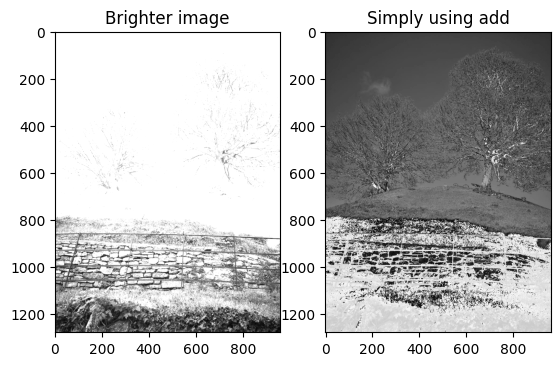

In [ ]:
# using cv2.add vs simply add
brighter = cv2.add(trees,M)
added = trees + M
plt.subplot(1,2,1)
plt.imshow(brighter,cmap='gray')
plt.title("Brighter image")
plt.subplot(1,2,2)
plt.imshow(added,cmap='gray')
plt.title("Simply using add")

In [ ]:
print(trees)
print(brighter)

[[100 100 100 ... 102 102 102]
 [100 100 100 ... 103 102 102]
 [100 100 100 ... 103 103 102]
 ...
 [ 23  20  19 ...  10   9   9]
 [ 26  22  19 ...  10  10   9]
 [ 32  26  21 ...  10  10   9]]
[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [223 220 219 ... 210 209 209]
 [226 222 219 ... 210 210 209]
 [232 226 221 ... 210 210 209]]


In [ ]:
print(trees)
print(added)

[[100 100 100 ... 102 102 102]
 [100 100 100 ... 103 102 102]
 [100 100 100 ... 103 103 102]
 ...
 [ 23  20  19 ...  10   9   9]
 [ 26  22  19 ...  10  10   9]
 [ 32  26  21 ...  10  10   9]]
[[ 44  44  44 ...  46  46  46]
 [ 44  44  44 ...  47  46  46]
 [ 44  44  44 ...  47  47  46]
 ...
 [223 220 219 ... 210 209 209]
 [226 222 219 ... 210 210 209]
 [232 226 221 ... 210 210 209]]


*Decreasing brightness*

In [ ]:
# using cv2.subtract vs minus
N = np.ones(trees.shape,dtype=np.uint8)*50
subtracted = cv2.subtract(trees,N)
print(subtracted)
minus = trees - N
print(minus)

[[50 50 50 ... 52 52 52]
 [50 50 50 ... 53 52 52]
 [50 50 50 ... 53 53 52]
 ...
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]]
[[ 50  50  50 ...  52  52  52]
 [ 50  50  50 ...  53  52  52]
 [ 50  50  50 ...  53  53  52]
 ...
 [229 226 225 ... 216 215 215]
 [232 228 225 ... 216 216 215]
 [238 232 227 ... 216 216 215]]


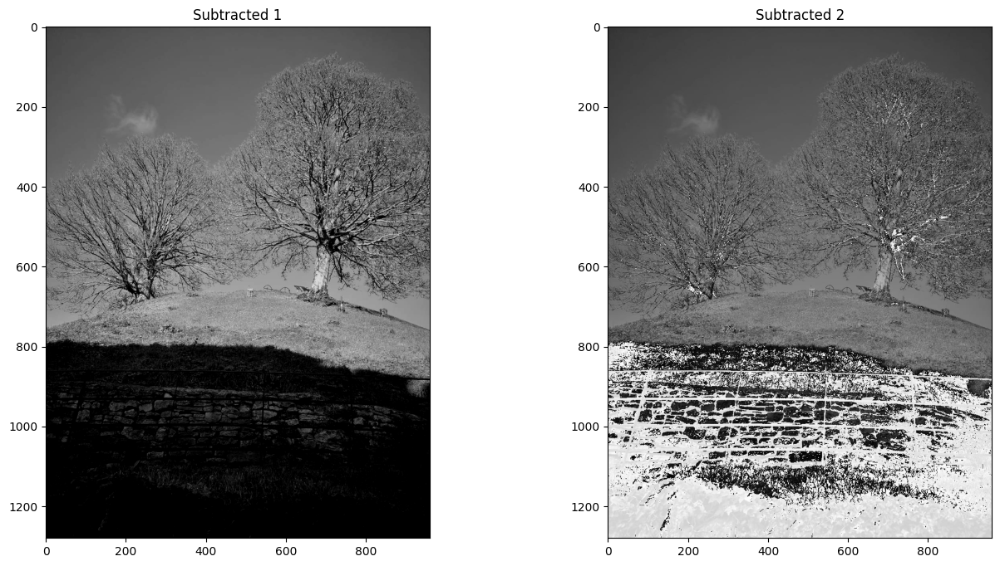

In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(1,2,1)
plt.imshow(subtracted,cmap='gray')
plt.title("Subtracted 1")

plt.subplot(1,2,2)
plt.imshow(minus,cmap='gray')
plt.title("Subtracted 2")

plt.show()


 **Bitwise and masking**

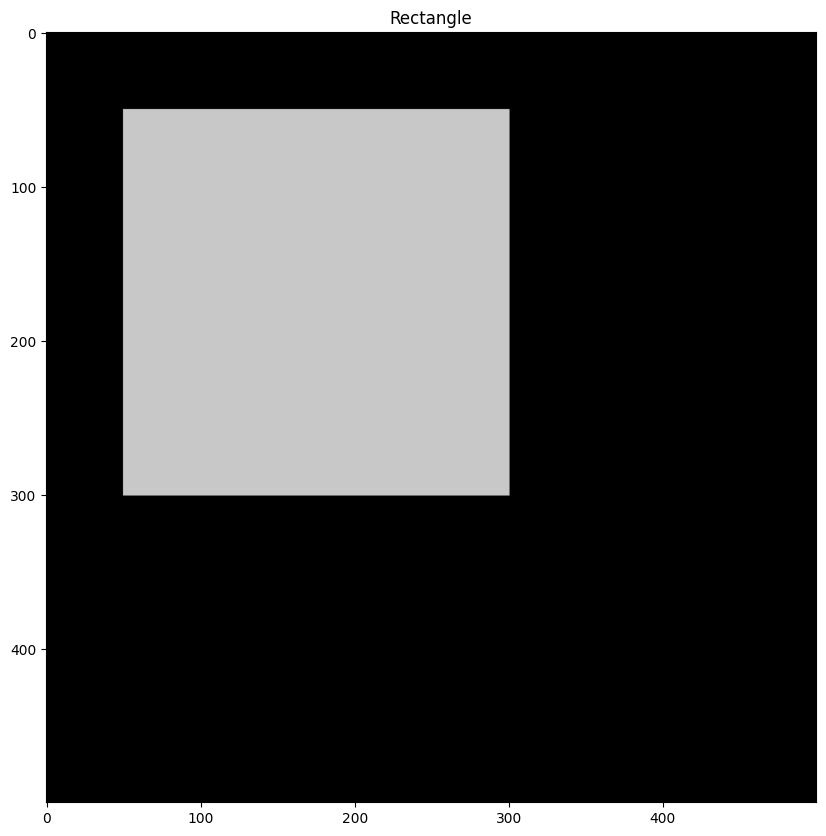

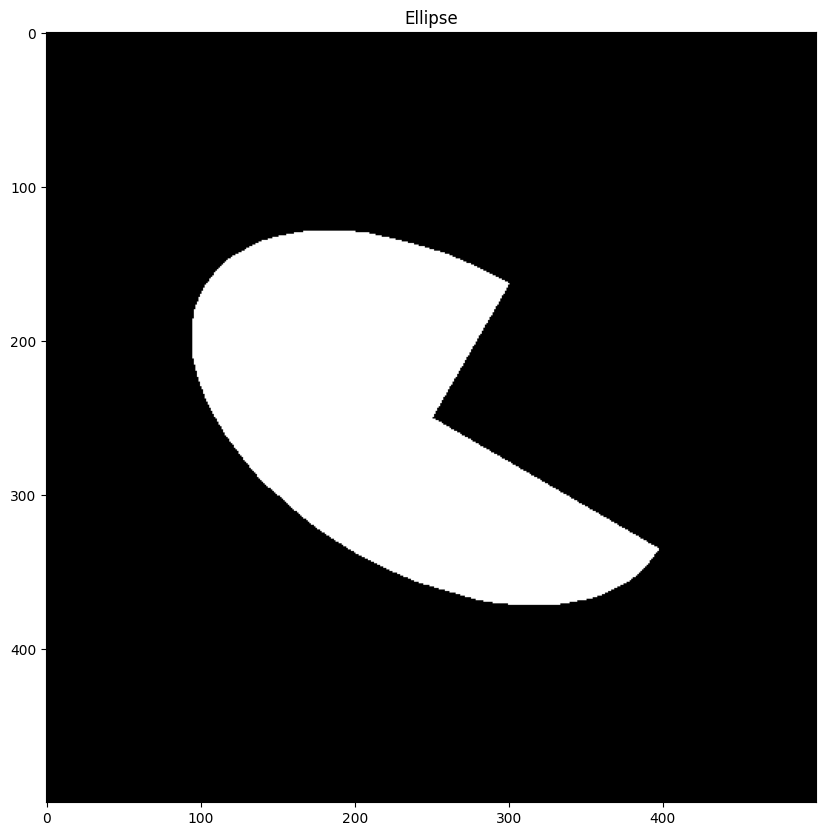

In [ ]:
bg1 = np.zeros((500,500),dtype=np.uint8)
bg2= np.zeros((500,500),dtype=np.uint8)

# Draw rectangle and ellipse
cv2.rectangle(bg1,(50,50),(300,300),200,-1)
cv2.ellipse(bg2,(250,250),(170,100),30,0,270,255,-1)
display("Rectangle",bg1)
display("Ellipse",bg2)

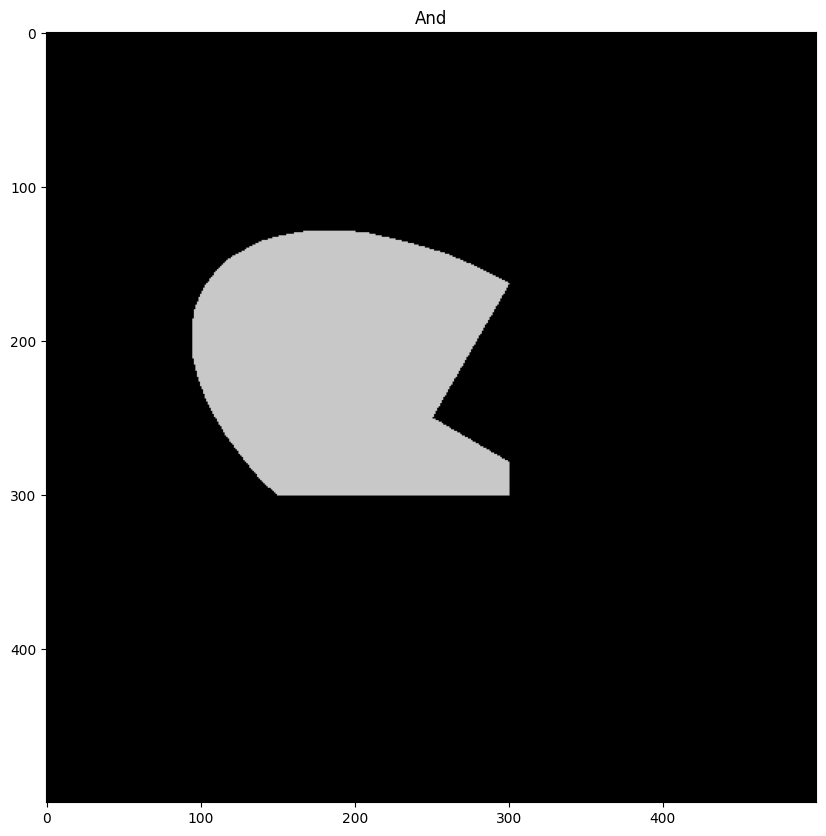

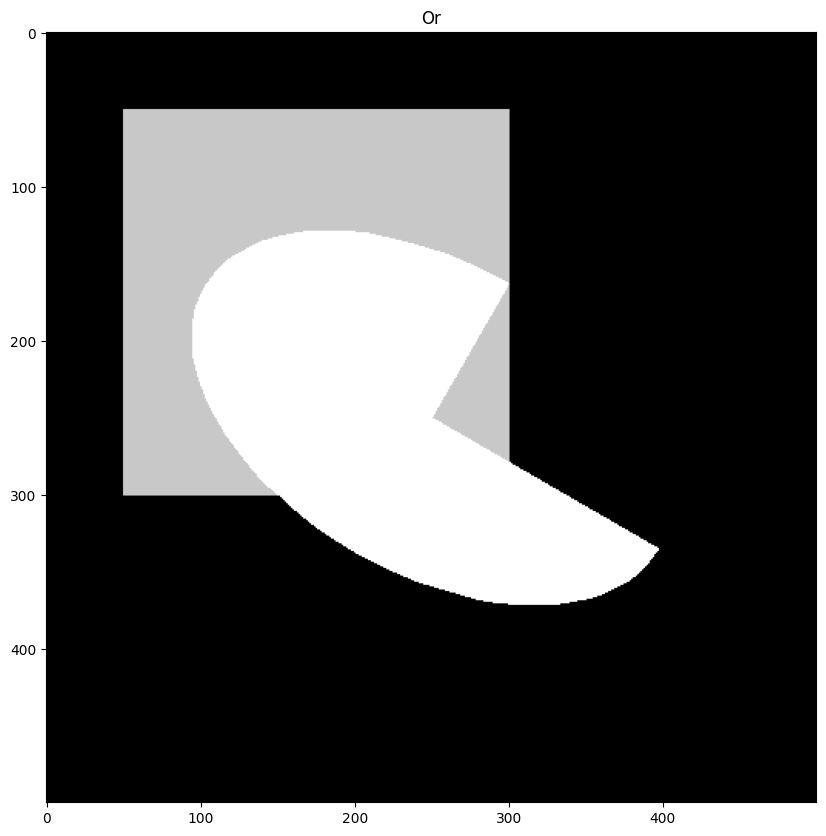

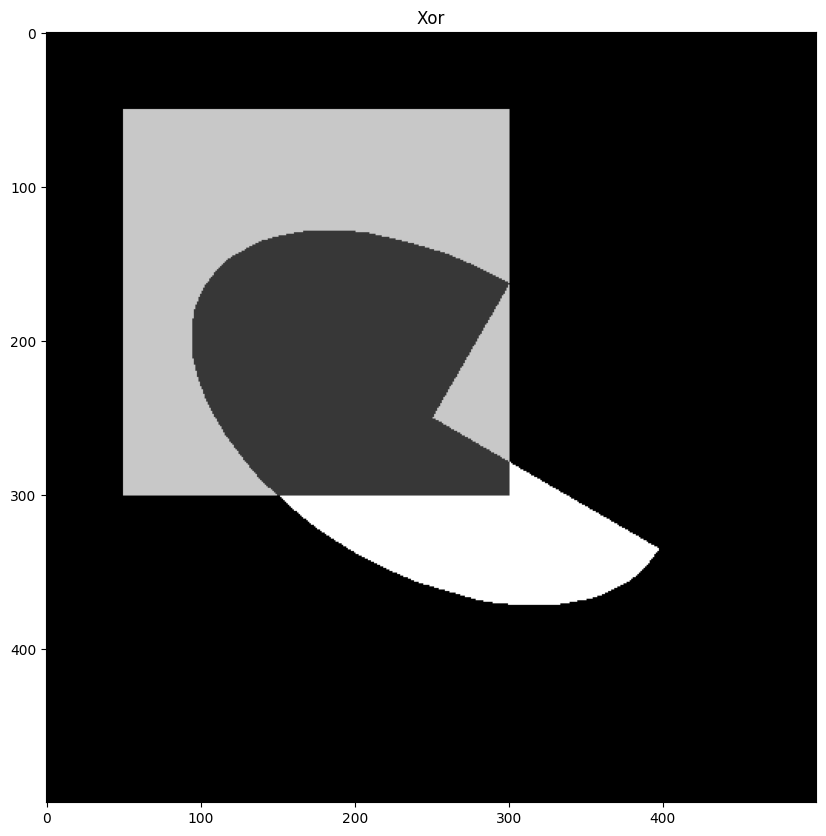

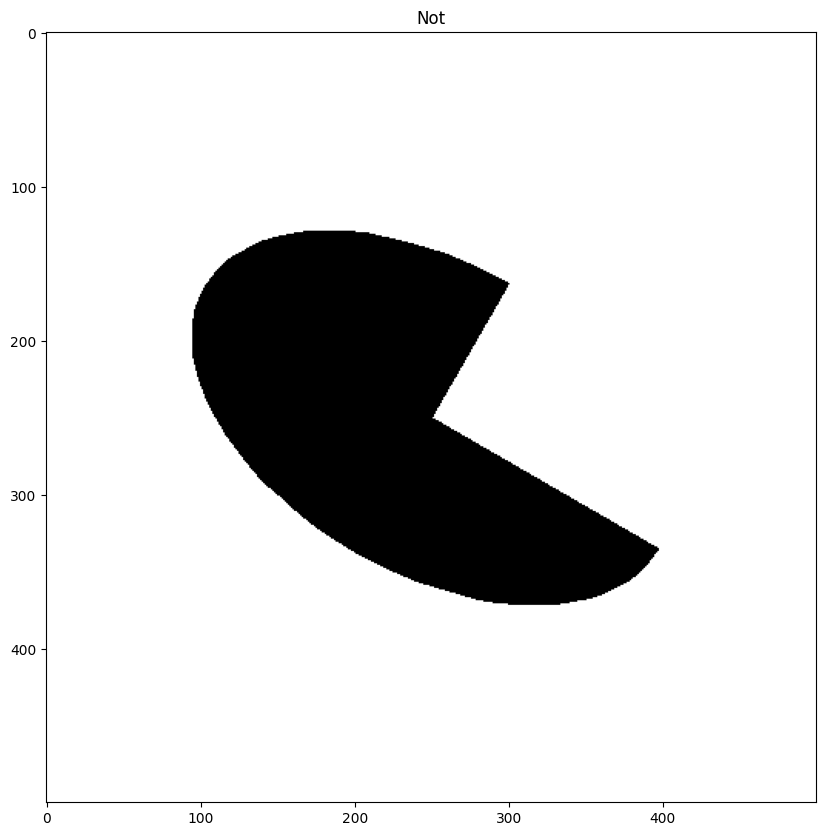

In [ ]:
And = cv2.bitwise_and(bg1,bg2)
display("And",And)

Or = cv2.bitwise_or(bg1,bg2)
display("Or",Or)

Xor = cv2.bitwise_xor(bg1,bg2)
display("Xor",Xor)

Not_Ellipse = cv2.bitwise_not(bg2)
display("Not",Not_Ellipse)

# **8. Convolutions, Blurring and Sharpening Images.**

*Convolution and blurring*

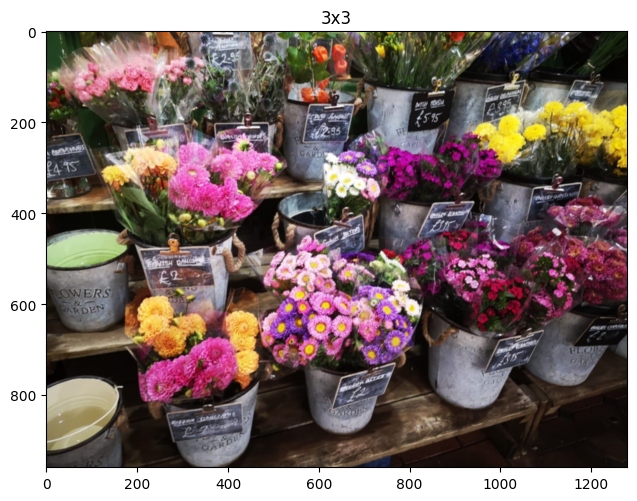

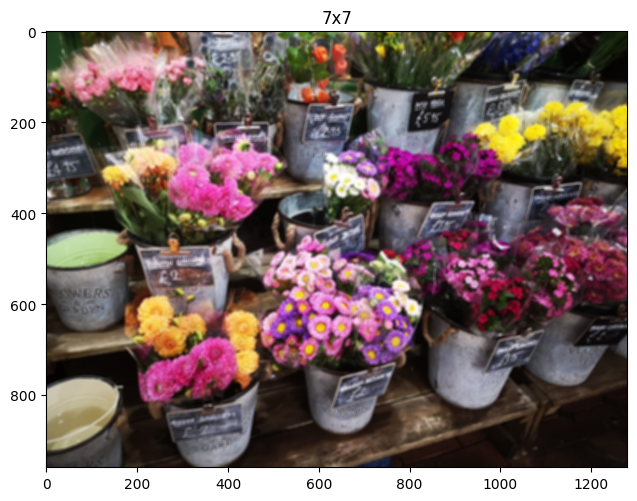

In [ ]:
# creating a kernel 3x3
ker3 = np.ones((3,3),dtype=np.float32)/9
# Convolution
blurred = cv2.filter2D(flowers,-1,ker3)
display("3x3",blurred)
# Creating a kernel 7x7
ker7 = np.ones((7,7),dtype=np.float32)/49
blurred2 = cv2.filter2D(flowers,-1,ker7)
display("7x7",blurred2)

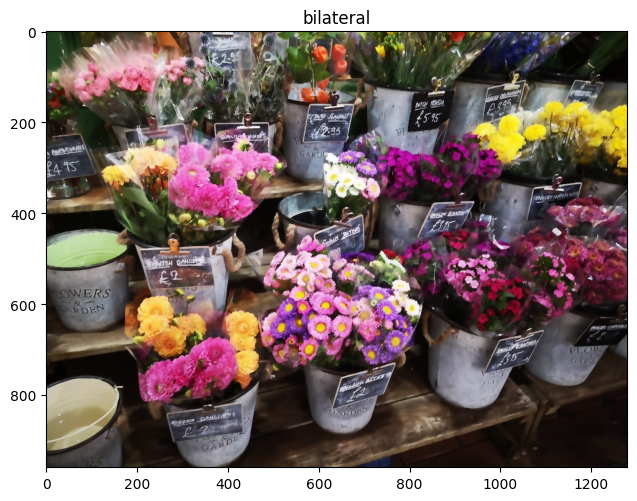

In [ ]:
bilateral = cv2.bilateralFilter(flowers,9,75,75)
display("bilateral",bilateral)

Non-local denoising

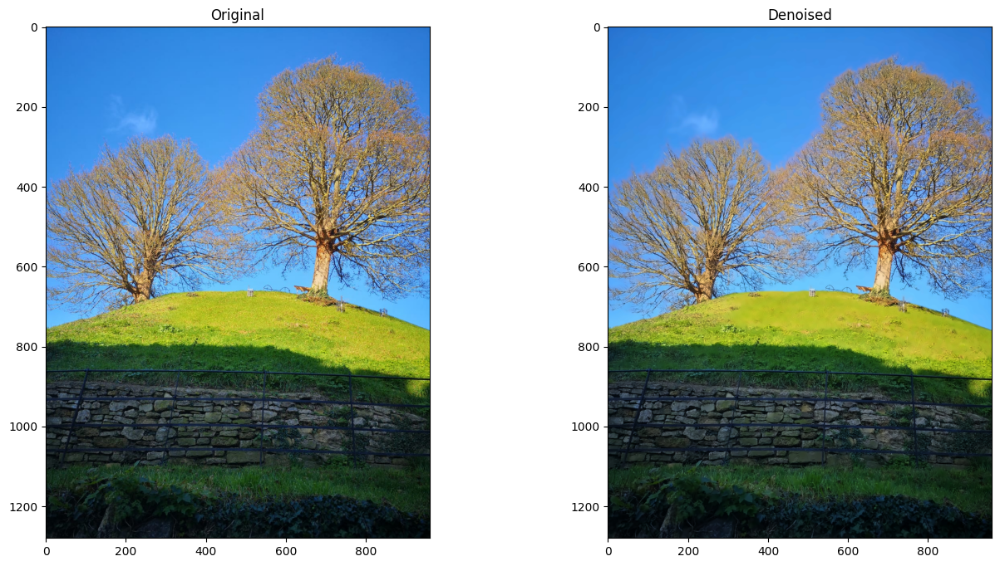

In [ ]:
trees = cv2.imread("images/trees.jpeg")
dst = cv2.fastNlMeansDenoisingColored(trees,None,5,5,7,10)
plt.figure(figsize=(16,8))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(trees,cv2.COLOR_BGR2RGB))
plt.title("Original")

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(dst,cv2.COLOR_BGR2RGB))
plt.title("Denoised")

plt.show()

# **Thresholding & Binarization**

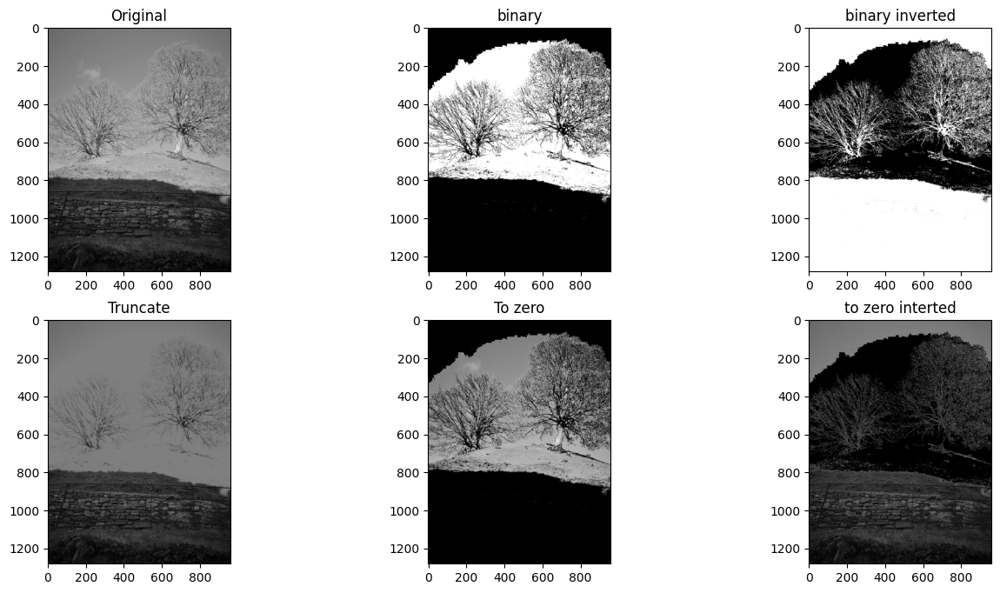

In [ ]:
trees = cv2.imread("images/trees.jpeg",0)
ret, thresh1 = cv2.threshold(trees,127,255,cv2.THRESH_BINARY)
ret, thresh2 = cv2.threshold(trees,127,255,cv2.THRESH_BINARY_INV)
ret, thresh3 = cv2.threshold(trees,127,255,cv2.THRESH_TRUNC)
ret, thresh4 = cv2.threshold(trees,127,255,cv2.THRESH_TOZERO)
ret, thresh5 = cv2.threshold(trees,127,255,cv2.THRESH_TOZERO_INV)


plt.figure(figsize=(16,8))

plt.subplot(2,3,1)
plt.imshow(trees,cmap='gray')
plt.title("Original")

plt.subplot(2,3,2)
plt.imshow(cv2.cvtColor(thresh1,cv2.COLOR_BGR2RGB))
plt.title("binary")

plt.subplot(2,3,3)
plt.imshow(cv2.cvtColor(thresh2,cv2.COLOR_BGR2RGB))
plt.title("binary inverted")

plt.subplot(2,3,4)
plt.imshow(cv2.cvtColor(thresh3,cv2.COLOR_BGR2RGB))
plt.title("Truncate")

plt.subplot(2,3,5)
plt.imshow(cv2.cvtColor(thresh4,cv2.COLOR_BGR2RGB))
plt.title("To zero")

plt.subplot(2,3,6)
plt.imshow(cv2.cvtColor(thresh5,cv2.COLOR_BGR2RGB))
plt.title("to zero interted")

plt.show()

In [ ]:
print(ret)

127.0


Text(0.5, 1.0, 'otsu')

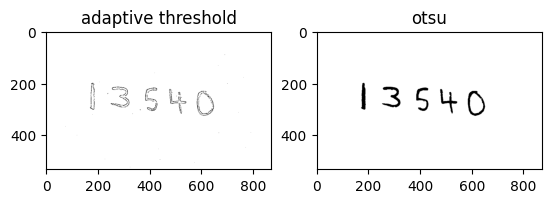

In [ ]:
# Using adaptive threshold
numbers = cv2.imread("images/numbers.jpg",0)
numbers = cv2.GaussianBlur(numbers,(3,3),0)
apt_thresh = cv2.adaptiveThreshold(numbers,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,3,5)
_, otsu = cv2.threshold(numbers,0,127,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

plt.subplot(1,2,1)
plt.imshow(apt_thresh,cmap='gray')
plt.title("adaptive threshold")

plt.subplot(1,2,2)
plt.imshow(otsu,cmap='gray')
plt.title("otsu")

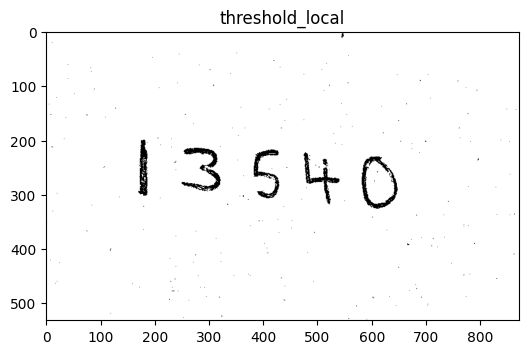

In [ ]:
from skimage.filters import threshold_local
numbers = cv2.imread("images/numbers.jpg")
# We get the Value component from the HSV color space
# then we apply adaptive thresholdingto
V = cv2.split(cv2.cvtColor(numbers, cv2.COLOR_BGR2HSV))[2]
T = threshold_local(V, 25, offset=15, method="gaussian")

# Apply the threshold operation
thresh = (V > T).astype("uint8") * 255
display("threshold_local", thresh)

In [ ]:
print(T)

[[191.38976962 191.47825516 191.64144041 ... 211.57873462 211.63690639
  211.66842164]
 [191.53512822 191.62096419 191.77902706 ... 211.54462683 211.60150251
  211.63239331]
 [191.80311437 191.88381344 192.03195585 ... 211.4833231  211.53799666
  211.56783055]
 ...
 [195.05103095 195.05997103 195.07964965 ... 211.38384279 211.37219058
  211.36289845]
 [195.21480467 195.22486302 195.24663579 ... 211.30378447 211.29534066
  211.2877104 ]
 [195.30163276 195.31245639 195.33568296 ... 211.2588291  211.25220343
  211.24552039]]


In [ ]:
print((V>T).astype('uint8'))

[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
